In [1]:
# jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

import os
#os.environ["CUDA_VISIBLE_DEVICES"]="-1" 

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D
from tensorflow.keras.layers import Conv2D, Activation, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Accuracy
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.python.client import device_lib
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score

tf.config.allow_growth = True
tf.config.per_process_gpu_memory_fraction = 0.9

from random import randint
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from PIL import Image
import random as rdn

In [2]:
# check the tensorflow version
print('Tensorflow Version: ' + tf.__version__)

# check the number of available GPUs
physical_devices = tf.config.list_physical_devices('CPU')#('GPU')
# print("Num GPUs:", len(physical_devices))
print(physical_devices)

Tensorflow Version: 2.15.0
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


<Axes: xlabel='count', ylabel='category'>

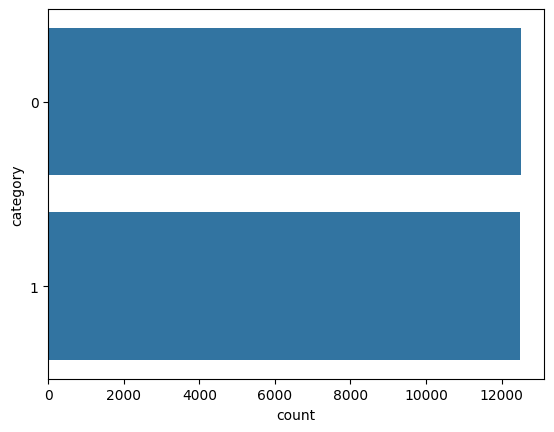

In [3]:
# set the directory for train and validation images
train_path = 'data/images/cats-and-dogs/train/'
#test_path = 'data/cats-and-dogs/test/'

# function to create a list of image labels 
def createImageDf(path):
    filenames = os.listdir(path)
    categories = []

    for fname in filenames:
        category = fname.split('.')[0]
        if category == 'dog':
            categories.append(1)
        else:
            categories.append(0)
    df = pd.DataFrame({
        'filename':filenames,
        'category':categories
    })
    return df

# display the header of the train_df dataset
image_df = createImageDf(train_path)
image_df.head(5)

sns.countplot(y='category', data=image_df, orient="h", legend=False)

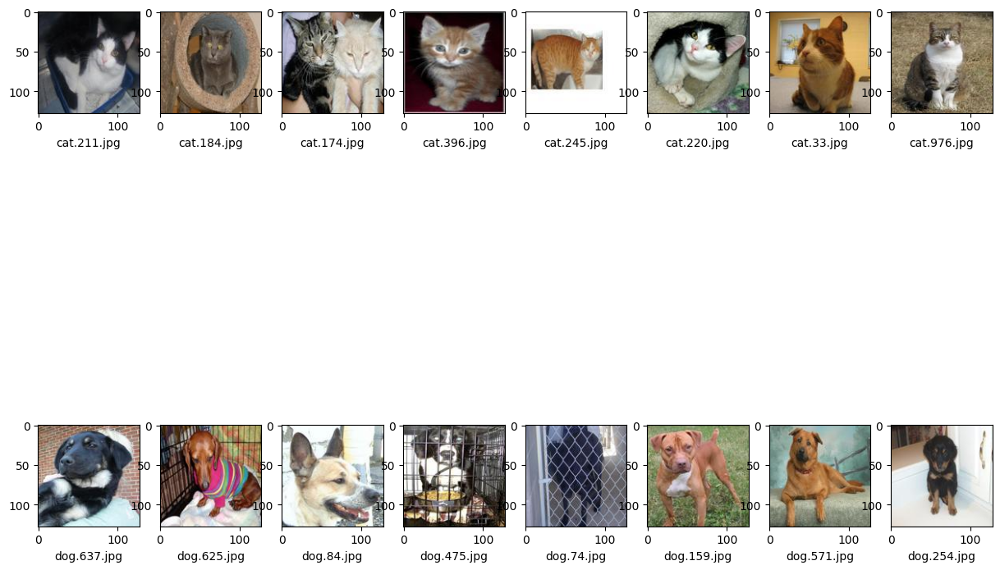

In [4]:
n_pictures = 16 # number of pictures to be shown
columns = int(n_pictures / 2)
rows = 2
plt.figure(figsize=(15, 12))
for i in range(n_pictures):
    num = i + 1
    ax = plt.subplot(rows, columns, i + 1)
    if i < columns:
        image_name = 'cat.' + str(rdn.randint(1, 1000)) + '.jpg'
    else: 
        image_name = 'dog.' + str(rdn.randint(1, 1000)) + '.jpg'
    plt.xlabel(image_name)    
    plt.imshow(load_img(train_path + image_name)) 

#if you get a deprecated warning, you can ignore it

In [5]:
image_df["category"] = image_df["category"].replace({0:'cat', 1:'dog'})

train_df, validate_df = train_test_split(image_df, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
total_train = train_df.shape[0]

validate_df = validate_df.reset_index(drop=True)
total_validate = validate_df.shape[0]
print(train_df.head())

print(len(train_df), len(validate_df))

        filename category
0   dog.8458.jpg      dog
1   dog.3502.jpg      dog
2  cat.10915.jpg      cat
3  dog.10126.jpg      dog
4  cat.11377.jpg      cat
19998 5000


In [6]:
# set the dimensions to which we will convert the images
img_width, img_height = 128, 128
target_size = (img_width, img_height)
batch_size = 32
rescale=1.0/255

# configure the train data generator
print('Train data:')
train_datagen = ImageDataGenerator(rescale=rescale)
train_generator = train_datagen.flow_from_dataframe(
    train_df, 
    train_path,
    shear_range=0.2, #
    zoom_range=0.2, #
    horizontal_flip=True, # 
    shuffle=True, # shuffle the image data
    x_col='filename', y_col='category',
    classes=['dog', 'cat'],
    target_size=target_size,
    batch_size=batch_size,
    color_mode="rgb",
    class_mode='binary',
    validate_filenames=True)

# configure test data generator
# only rescaling
print('Test data:')
validation_datagen = ImageDataGenerator(rescale=rescale)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df, 
    train_path,    
    shuffle=True,
    x_col='filename', y_col='category',
    classes=['dog', 'cat'],
    target_size=target_size,
    batch_size=batch_size,
    color_mode="rgb",
    class_mode='binary',
    validate_filenames=True)

Train data:
Found 19998 validated image filenames belonging to 2 classes.
Test data:
Found 5000 validated image filenames belonging to 2 classes.


In [7]:
# define the input format of the model
input_shape = (img_width, img_height, 3)
print(input_shape)

# define  model
model = Sequential()
model.add(Conv2D(32, (3, 3), strides=(1, 1), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=input_shape))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.20))
model.add(Conv2D(64, (3, 3), strides=(1, 1), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.20))
model.add(Conv2D(64, (3, 3), strides=(1, 1), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.20))
model.add(Conv2D(128, (3, 3),  strides=(1, 1),activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.20))
model.add(Flatten())
model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

# compile the model and print its architecture
history = model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
print(model.summary())

(128, 128, 3)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 64, 64, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 32, 64)        0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 32, 

In [8]:
# train the model
epochs = 10
early_stop = EarlyStopping(monitor='loss', patience=1, verbose=1)

history = model.fit(
    train_generator,
    epochs=epochs,
    callbacks=[early_stop],
    steps_per_epoch=len(train_generator),
    verbose=1,
    validation_data=validation_generator,
    validation_steps=len(validation_generator))

Epoch 1/10


625/625 [==============================] - 102s 162ms/step - loss: 0.7200 - accuracy: 0.5762 - val_loss: 0.6181 - val_accuracy: 0.6906
Epoch 2/10
625/625 [==============================] - 103s 165ms/step - loss: 0.5898 - accuracy: 0.6917 - val_loss: 0.5583 - val_accuracy: 0.7386
Epoch 3/10
625/625 [==============================] - 105s 167ms/step - loss: 0.5308 - accuracy: 0.7406 - val_loss: 0.4719 - val_accuracy: 0.7858
Epoch 4/10
625/625 [==============================] - 103s 165ms/step - loss: 0.4625 - accuracy: 0.7906 - val_loss: 0.4307 - val_accuracy: 0.7962
Epoch 5/10
625/625 [==============================] - 104s 166ms/step - loss: 0.4200 - accuracy: 0.8123 - val_loss: 0.4062 - val_accuracy: 0.8126
Epoch 6/10
625/625 [==============================] - 103s 165ms/step - loss: 0.3776 - accuracy: 0.8377 - val_loss: 0.3421 - val_accuracy: 0.8450
Epoch 7/10
625/625 [==============================] - 106s 170ms/step - loss: 0.3461 - accuracy: 0.8534 - val_loss: 0.3319

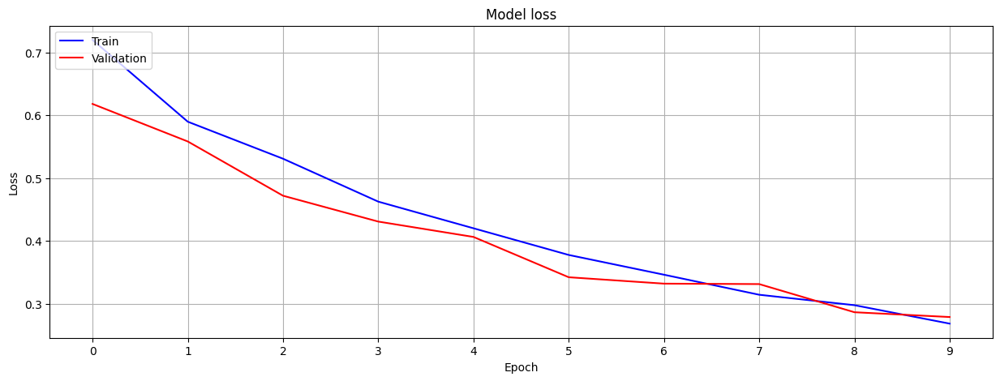

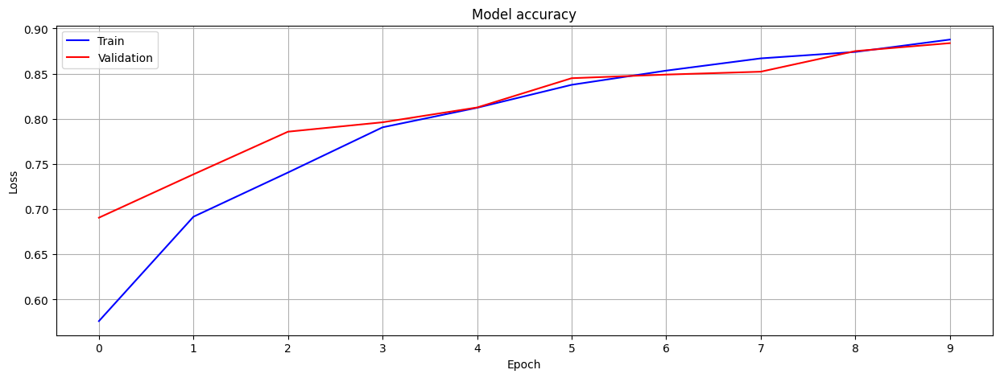

In [9]:
def plot_loss(history, value1, value2, title):
    fig, ax = plt.subplots(figsize=(15, 5), sharex=True)
    plt.plot(history.history[value1], 'b')
    plt.plot(history.history[value2], 'r')
    plt.title(title)
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    ax.xaxis.set_major_locator(plt.MaxNLocator(epochs))
    plt.legend(["Train", "Validation"], loc="upper left")
    plt.grid()
    plt.show()

# plot training & validation loss values
plot_loss(history, "loss", "val_loss", "Model loss")
# plot training & validation loss values
plot_loss(history, "accuracy", "val_accuracy", "Model accuracy")

157/157 [==============================] - 6s 35ms/step


C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3369906204.py:14: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  val_df['pred'][i] = getLabel(val_pred_prob[i])
C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3369906204.py:14: FutureWarnin

Accuracy: 0.51


C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3369906204.py:14: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  val_df['pred'][i] = getLabel(val_pred_prob[i])
C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3369906204.py:14: FutureWarnin

Text(0.5, 58.7222222222222, 'Predicted label')

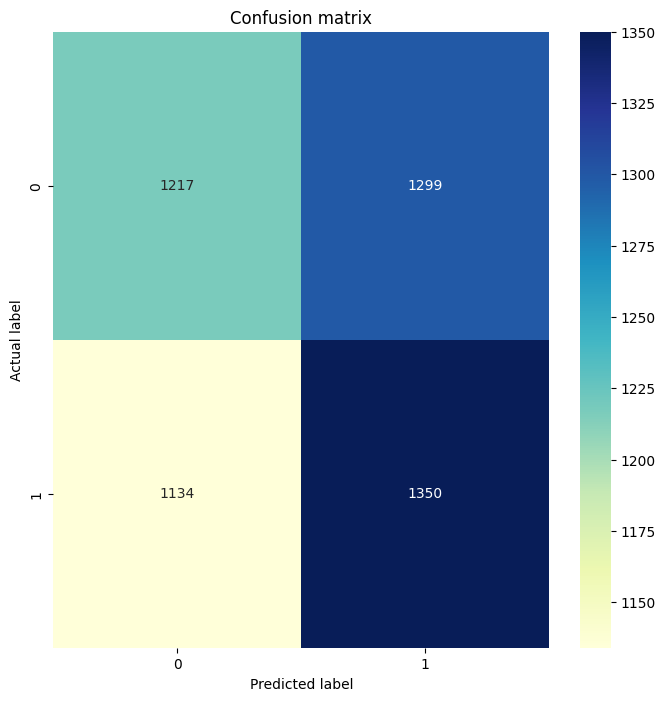

In [10]:
# function that returns the label for a given probability
def getLabel(prob):
    if(prob > .5):
        return 'dog'
    else:
        return 'cat'

# get the predictions for the validation data
val_df = validate_df.copy()
val_df['pred'] = ""
val_pred_prob = model.predict(validation_generator)

for i in range(val_pred_prob.shape[0]):
    val_df['pred'][i] = getLabel(val_pred_prob[i])
          
# create a confusion matrix
y_val = val_df['category']
y_pred = val_df['pred']

print('Accuracy: {:.2f}'.format(accuracy_score(y_val, y_pred)))
cnf_matrix = confusion_matrix(y_val, y_pred)

# plot the confusion matrix in form of a heatmap

%matplotlib inline
class_names=[False, True] # name  of classes
fig, ax = plt.subplots(figsize=(8, 8))
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu", fmt='g')
plt.title('Confusion matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

Found 24 validated image filenames belonging to 2 classes.
1/1 [==============================] - 0s 405ms/step
Accuracy: 0.21


C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3112010652.py:22: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  sample_df['pred'][i] = getLabel(pred_prob[i])
C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3112010652.py:22: FutureWarning

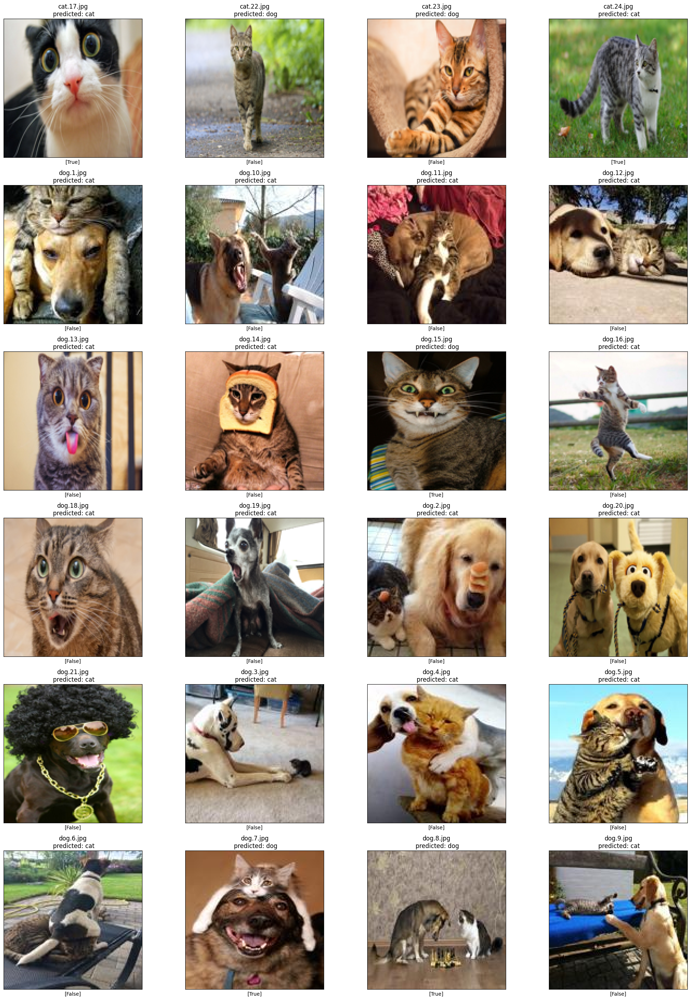

In [11]:
# set the path to the sample images
sample_path = "data/images/cats-and-dogs/sample/"
sample_df = createImageDf(sample_path)
sample_df['category'] = sample_df['category'].replace({0:'cat', 1:'dog'})
sample_df['pred'] = ""

# create an image data generator for the sample images - we will only rescale the images
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    sample_df, 
    sample_path,    
    shuffle=False,
    x_col='filename', y_col='category',
    target_size=target_size)

# make the predictions 
pred_prob = model.predict(test_generator)
image_number = pred_prob.shape[0]

# define the plot size
for i in range(pred_prob.shape[0]):
    sample_df['pred'][i] = getLabel(pred_prob[i])
    
print('Accuracy: {:.2f}'.format(accuracy_score(sample_df['category'], sample_df['pred'])))

nrows = 6
ncols = int(round(image_number / nrows, 0))
fig, axs = plt.subplots(nrows, ncols, figsize=(25, 35))
for i, ax in enumerate(fig.axes):
    if i < sample_df.shape[0]:
        filepath = sample_path + sample_df.at[i ,'filename']
        ax = ax
        img = Image.open(filepath).resize(target_size)
        ax.imshow(img)
        ax.set_title(sample_df.at[i ,'filename'] + '\n' + ' predicted: '  + str(sample_df.at[i ,'pred']))
        result = [True if sample_df.at[i ,'pred'] == sample_df.at[i ,'category'] else False]
        ax.set_xlabel(str(result))
        ax.set_xticks([]); ax.set_yticks([])

In [24]:
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D

def model_maker(activation):
    base_model = ResNet50(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = MobileNet(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = ResNetRS420(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = ResNet50V2(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = VGG19(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = NASNetLarge(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = InceptionResNetV2(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = Xception(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = InceptionV3(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = DenseNet169(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = EfficientNetV2S(include_top=False, input_shape = (img_width, img_height, 3))
    # base_model = ConvNeXtXLarge(include_top=False, input_shape = (img_width, img_height, 3))
    
    for layer in base_model.layers[:]:
        layer.trainable = False # Freeze the layers
        
    input = Input(shape=(img_width, img_height, 3))
    custom_model = base_model(input)
    custom_model = GlobalAveragePooling2D()(custom_model) # GlobalMaxPooling2D()(custom_model)
    custom_model = Dense(64, activation='relu')(custom_model)
    custom_model = Dropout(0.5)(custom_model)
    predictions = Dense(1, activation=activation)(custom_model) # activation = 'sigmoid', activation = 'softmax'
    return Model(inputs=input, outputs=predictions)

model = model_maker('softmax') #sigmoid

model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_6 (Dense)             (None, 64)                131136    
                                                                 
 dropout_7 (Dropout)         (None, 64)                0         
                                                                 
 dense_7 (Dense)             (None, 1)                 65        
                                                           

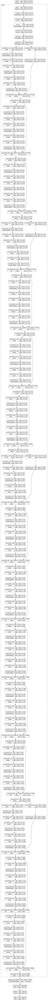

In [25]:
import keras
keras.utils.plot_model(model, expand_nested=True, dpi=60, show_shapes=True, to_file='myResNet.png')

In [26]:
from keras import metrics

#Binary cross entropy of each label. So no really a binary classification problem but
#Calculating binary cross entropy for each label. 
# model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss='categorical_crossentropy', metrics=['accuracy'])

# model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss='categorical_crossentropy', metrics=[metrics.mae, metrics.categorical_accuracy])
# model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss='categorical_crossentropy', metrics=[metrics.categorical_accuracy])

model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3),
              loss='binary_crossentropy', # 'categorical_crossentropy',
              metrics=['accuracy', 
                       metrics.AUC(num_thresholds=5),
                       metrics.BinaryAccuracy(threshold=0.5), # for balance a class-imbalanced data set
                       metrics.Precision(),
                       metrics.Recall(),
                       metrics.TruePositives(),
                       metrics.TrueNegatives(),
                       metrics.FalsePositives(),
                       metrics.FalseNegatives()])

In [27]:
# Обучаем модель с использованием генераторов
# train_generator - генератор данных для обучения
# validation_data - генератор данных для проверки

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=2)

# Need to run with real data to infer shape of different layers
history = model.fit(train_generator,
    steps_per_epoch=6,
    epochs=10,
    validation_data=validation_generator,
    validation_steps=1,
    callbacks=[callback])

Epoch 1/10
6/6 [==============================] - 7s 703ms/step - loss: 0.8254 - accuracy: 0.4844 - auc_2: 0.5000 - binary_accuracy: 0.4844 - precision_2: 0.4844 - recall_2: 1.0000 - true_positives_2: 93.0000 - true_negatives_2: 0.0000e+00 - false_positives_2: 99.0000 - false_negatives_2: 0.0000e+00 - val_loss: 0.6805 - val_accuracy: 0.6875 - val_auc_2: 0.5000 - val_binary_accuracy: 0.6875 - val_precision_2: 0.6875 - val_recall_2: 1.0000 - val_true_positives_2: 22.0000 - val_true_negatives_2: 0.0000e+00 - val_false_positives_2: 10.0000 - val_false_negatives_2: 0.0000e+00
Epoch 2/10
6/6 [==============================] - 3s 448ms/step - loss: 0.7627 - accuracy: 0.4531 - auc_2: 0.5000 - binary_accuracy: 0.4531 - precision_2: 0.4531 - recall_2: 1.0000 - true_positives_2: 87.0000 - true_negatives_2: 0.0000e+00 - false_positives_2: 105.0000 - false_negatives_2: 0.0000e+00 - val_loss: 0.6998 - val_accuracy: 0.4688 - val_auc_2: 0.5000 - val_binary_accuracy: 0.4688 - val_precision_2: 0.4688 - 

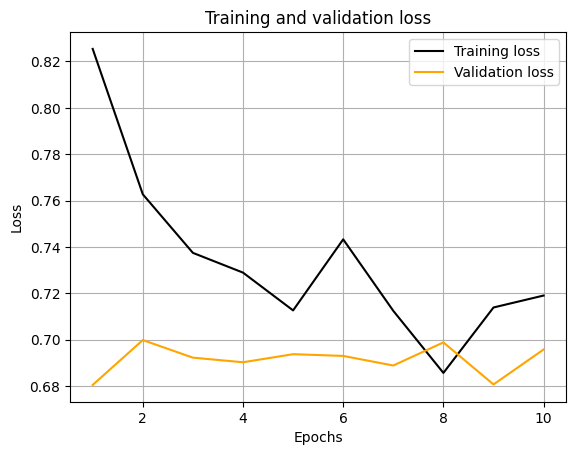

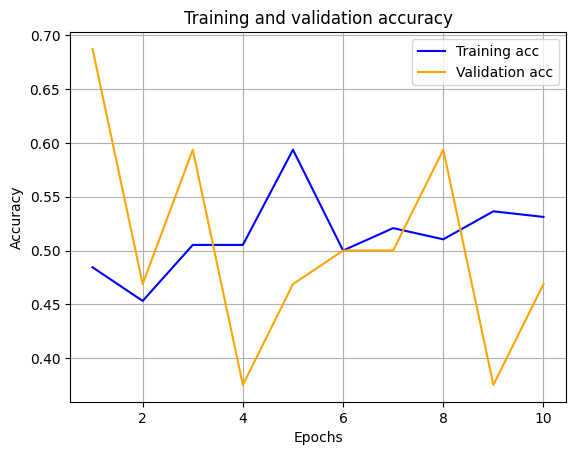

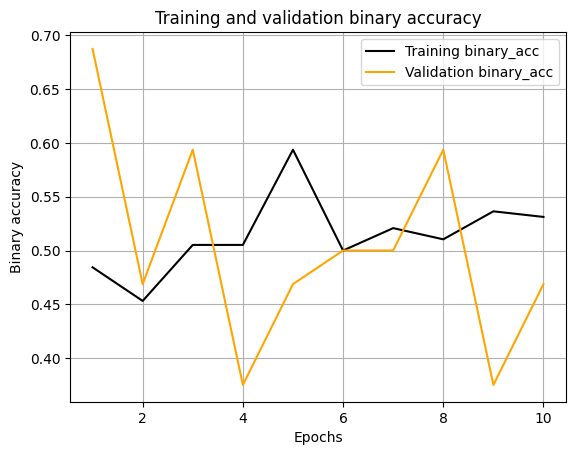

In [30]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'black', label='Training loss')
plt.plot(epochs, val_loss, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
# plt.savefig('loss-5epochs.png')
plt.show()


acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'blue', label='Training acc')
plt.plot(epochs, val_acc, 'orange', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
# plt.savefig('acc-5epochs.png')
plt.show()


binary_acc = history.history['binary_accuracy']
val_binary_acc = history.history['val_binary_accuracy']
plt.plot(epochs, binary_acc, 'black', label='Training binary_acc')
plt.plot(epochs, val_binary_acc, 'orange', label='Validation binary_acc')
plt.title('Training and validation binary accuracy')
plt.xlabel('Epochs')
plt.ylabel('Binary accuracy')
plt.legend()
plt.grid()
# plt.savefig('binary_acc-5epochs.png')
plt.show()


# precision = history.history['precision']
# val_precision = history.history['val_precision']
# plt.plot(epochs, precision, 'blue', label='Training precision')
# plt.plot(epochs, val_precision, 'orange', label='Validation precision')
# plt.title('Training and validation precision')
# plt.xlabel('Epochs')
# plt.ylabel('Precision')
# plt.legend()
# plt.grid()
# # plt.savefig('precision-5epochs.png')
# plt.show()

In [ ]:
# scores = model.evaluate(test_generator)
# print(model.metrics_names)
# print(scores)

In [ ]:
# from math import sqrt
# mcc = (scores[-4]*scores[-3] - scores[-2]*scores[-1])/sqrt((scores[-4]+scores[-2])*(scores[-4]+scores[-1])*(scores[-3]+scores[-2])*(scores[-3]+scores[-1]))
# print(f'Коэффициент корреляции Мэтьюса = {mcc}')

157/157 [==============================] - 52s 322ms/step


C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3369906204.py:14: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  val_df['pred'][i] = getLabel(val_pred_prob[i])
C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3369906204.py:14: FutureWarnin

Accuracy: 0.50


C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3369906204.py:14: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  val_df['pred'][i] = getLabel(val_pred_prob[i])
C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3369906204.py:14: FutureWarnin

Text(0.5, 58.7222222222222, 'Predicted label')

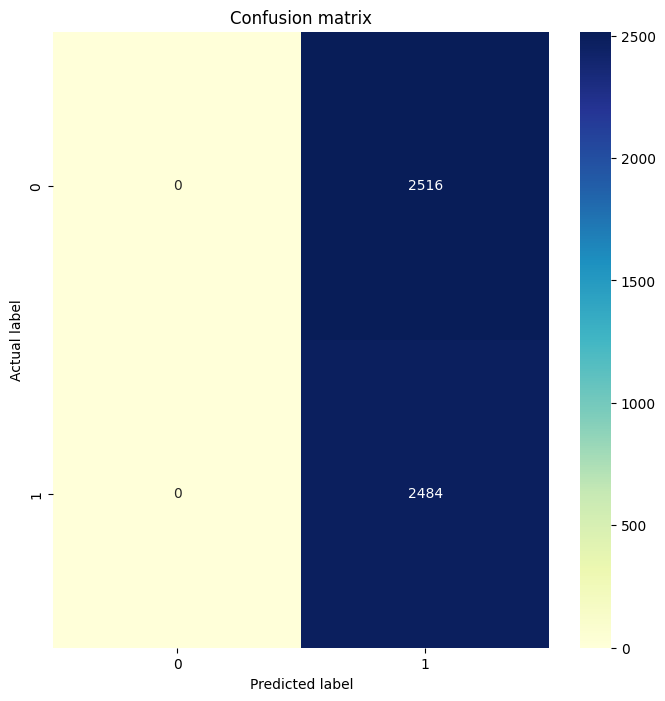

In [31]:
# function that returns the label for a given probability
def getLabel(prob):
    if(prob > .5):
        return 'dog'
    else:
        return 'cat'

# get the predictions for the validation data
val_df = validate_df.copy()
val_df['pred'] = ""
val_pred_prob = model.predict(validation_generator)

for i in range(val_pred_prob.shape[0]):
    val_df['pred'][i] = getLabel(val_pred_prob[i])
          
# create a confusion matrix
y_val = val_df['category']
y_pred = val_df['pred']

print('Accuracy: {:.2f}'.format(accuracy_score(y_val, y_pred)))
cnf_matrix = confusion_matrix(y_val, y_pred)

# plot the confusion matrix in form of a heatmap

%matplotlib inline
class_names=[False, True] # name  of classes
fig, ax = plt.subplots(figsize=(8, 8))
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu", fmt='g')
plt.title('Confusion matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

Found 24 validated image filenames belonging to 2 classes.
1/1 [==============================] - 1s 1s/step
Accuracy: 0.83


C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3112010652.py:22: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  sample_df['pred'][i] = getLabel(pred_prob[i])
C:\Users\Peter\AppData\Local\Temp\ipykernel_14948\3112010652.py:22: FutureWarning

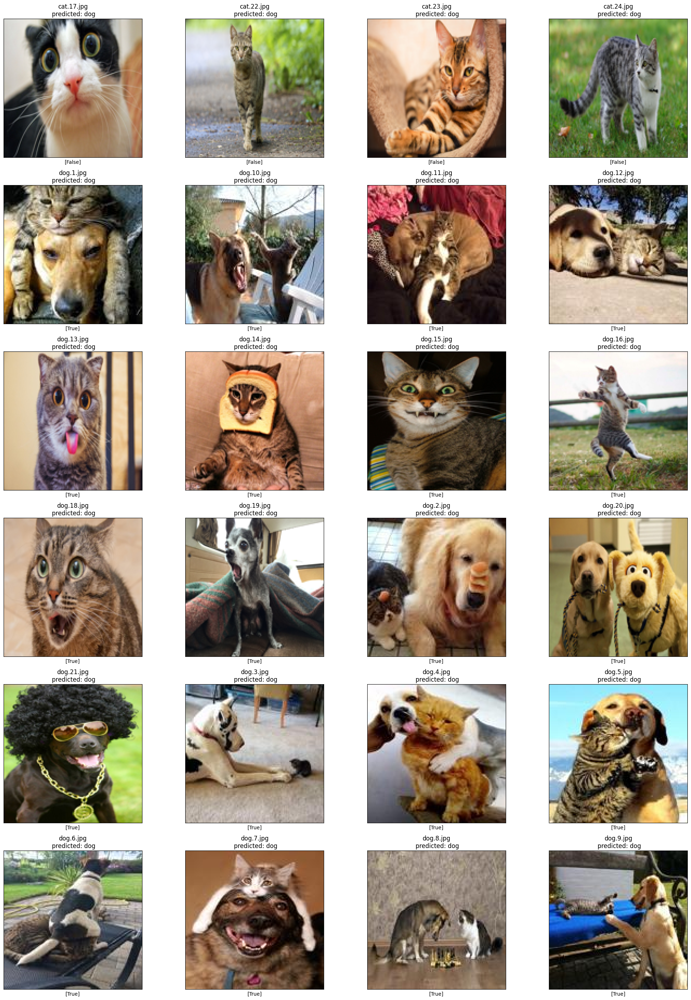

In [32]:
# set the path to the sample images
sample_path = "data/images/cats-and-dogs/sample/"
sample_df = createImageDf(sample_path)
sample_df['category'] = sample_df['category'].replace({0:'cat', 1:'dog'})
sample_df['pred'] = ""

# create an image data generator for the sample images - we will only rescale the images
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    sample_df, 
    sample_path,    
    shuffle=False,
    x_col='filename', y_col='category',
    target_size=target_size)

# make the predictions 
pred_prob = model.predict(test_generator)
image_number = pred_prob.shape[0]

# define the plot size
for i in range(pred_prob.shape[0]):
    sample_df['pred'][i] = getLabel(pred_prob[i])
    
print('Accuracy: {:.2f}'.format(accuracy_score(sample_df['category'], sample_df['pred'])))

nrows = 6
ncols = int(round(image_number / nrows, 0))
fig, axs = plt.subplots(nrows, ncols, figsize=(25, 35))
for i, ax in enumerate(fig.axes):
    if i < sample_df.shape[0]:
        filepath = sample_path + sample_df.at[i ,'filename']
        ax = ax
        img = Image.open(filepath).resize(target_size)
        ax.imshow(img)
        ax.set_title(sample_df.at[i ,'filename'] + '\n' + ' predicted: '  + str(sample_df.at[i ,'pred']))
        result = [True if sample_df.at[i ,'pred'] == sample_df.at[i ,'category'] else False]
        ax.set_xlabel(str(result))
        ax.set_xticks([]); ax.set_yticks([])